## HUMAN ACTION RECOGNITION

`USING CNN + LSTM` 

1. CNNs ARE GREAT FOR IMAGE DATA
2. LSTMs ARE GREAT FOR SEQUENCE DATA
3. COMBINATION OF CNN,LSTM CAN BE USED TO CLASSIY VIDEO DATA 
 
### Videos are Sequences of Frames (images)

`Step 1. IMPORT LIBRARIES`

In [1]:
import os
import cv2
import pafy
from pytube import YouTube
import random
import numpy as np
from colorama import Fore
from matplotlib import pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix

import tensorflow as tf
from keras.models import Model,Sequential,load_model
from keras.layers import *
from keras.callbacks import ModelCheckpoint,EarlyStopping
from keras.utils import np_utils
from tensorflow.keras.utils import plot_model

In [3]:
seed_c = 27  # to restrict the randonmess
np.random.seed(seed_c)
random.seed(seed_c)
tf.random.set_seed(seed_c)

`Step 2. Visualize the Data`

Here, we are working with `UCF-50 Dataset - Action recognition Dataset` -> which consists realistic videos of 50 different actions taken from youtube

Dataset Contains
- 50 Different Actions (Sports, Daily Activity, Playing Musical Instruments, Gym)
- 25 Groups of Videos per Action
- 133 Avg. Videos per Action
- 200 Avg. No. of Frames per Video   
- 320 Avg. Frames Width per Video
- 240 Avg. Frames Height per Video
- 26 Avg. FPS per Video (7-8 seconds video)

In [2]:
classes = os.listdir('UCF50')
print('Classes :',Fore.GREEN+" , ".join(classes)+Fore.RESET)

Classes : BaseballPitch , Basketball , BenchPress , Biking , Billiards , BreastStroke , CleanAndJerk , Diving , Drumming , Fencing , GolfSwing , HighJump , HorseRace , HorseRiding , HulaHoop , JavelinThrow , JugglingBalls , JumpingJack , JumpRope , Kayaking , Lunges , MilitaryParade , Mixing , Nunchucks , PizzaTossing , PlayingGuitar , PlayingPiano , PlayingTabla , PlayingViolin , PoleVault , PommelHorse , PullUps , Punch , PushUps , RockClimbingIndoor , RopeClimbing , Rowing , SalsaSpin , SkateBoarding , Skiing , Skijet , SoccerJuggling , Swing , TaiChi , TennisSwing , ThrowDiscus , TrampolineJumping , VolleyballSpiking , WalkingWithDog , YoYo


In [5]:
data = []

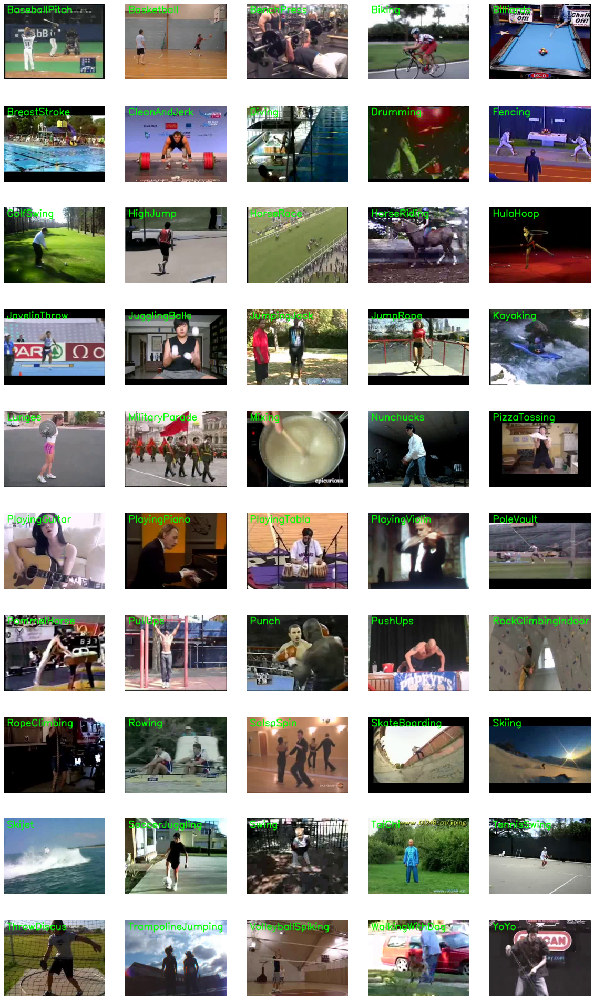

In [6]:
# visualizing first frame of random video from each class
plt.figure(figsize=(20,35))

for idx,action in enumerate(classes):

    video_file = os.listdir(os.path.join('UCF50',action)) # go to each action folder 
    data.append(len(video_file))

    # pick a random video out of it
    video = random.choice(video_file) # contains name of the video picked

    # to read from video
    cap = cv2.VideoCapture(os.path.join('UCF50',action,video))

    # extract first frame of video
    _,frame = cap.read()

    # release videocapture object
    cap.release()

    # since, cv2 has color format of BGR -> convert it to RGB format
    frame = cv2.cvtColor(frame,cv2.COLOR_BGR2RGB)

    # write label into image
    cv2.putText(frame,f'{action}',(10,30),cv2.FONT_HERSHEY_SIMPLEX,1,(0,255,0),2) # BGR

    plt.subplot(10,5,idx+1)
    plt.imshow(frame)
    plt.axis('off')

plt.show()


In [7]:
print('No. of Videos Per Each Class/Action')
avg = 0
for i,j in zip(classes,data):
    print(Fore.GREEN+f'{i}'+Fore.RESET,':',Fore.RED+f'{j}'+Fore.RESET)
    avg+=j
print(f'Average Video : {avg/50}')

No. of Videos Per Each Class/Action
BaseballPitch : 150
Basketball : 137
BenchPress : 160
Biking : 145
Billiards : 150
BreastStroke : 101
CleanAndJerk : 112
Diving : 153
Drumming : 161
Fencing : 111
GolfSwing : 142
HighJump : 123
HorseRace : 127
HorseRiding : 197
HulaHoop : 125
JavelinThrow : 117
JugglingBalls : 122
JumpingJack : 123
JumpRope : 148
Kayaking : 157
Lunges : 141
MilitaryParade : 127
Mixing : 141
Nunchucks : 150
PizzaTossing : 114
PlayingGuitar : 160
PlayingPiano : 105
PlayingTabla : 124
PlayingViolin : 100
PoleVault : 160
PommelHorse : 123
PullUps : 120
Punch : 160
PushUps : 106
RockClimbingIndoor : 148
RopeClimbing : 130
Rowing : 137
SalsaSpin : 133
SkateBoarding : 120
Skiing : 144
Skijet : 100
SoccerJuggling : 156
Swing : 137
TaiChi : 100
TennisSwing : 167
ThrowDiscus : 131
TrampolineJumping : 119
VolleyballSpiking : 116
WalkingWithDog : 123
YoYo : 128
Average Video : 133.62


In [8]:
# visualizing a video
cap = cv2.VideoCapture(os.path.join('UCF50','YoYo','v_YoYo_g01_c01.avi'))

if (cap.isOpened()== False):
    print("Error opening video file")
print('TOTAL FRAMES :',cap.get(cv2.CAP_PROP_FRAME_COUNT))

while cap.isOpened():
    ret,frame = cap.read()

    if ret == True:
        cv2.imshow('YoYo Video',frame)
        if cv2.waitKey(25) & 0xFF == ord('q'):
            break
    else:
        break

cap.release()
cv2.destroyAllWindows()

TOTAL FRAMES : 187.0


`Step 3. Preprocessing the data`

In [3]:
# resizing the frames of videos to 64X64 (less computation) and normalizing the data (faster convergence)
FRAME_HEIGHT,FRAME_WIDTH = 64,64  # higher dimesion -> better features learned, hence better acuracy, but computationally expensive

SEQ_LEN = 20 # no. of frames fed to the model as one sequence, will pick this frames uniformly distributed across video

CHOSEN_CLASS = ['WalkingWithDog','TaiChi','Swing','HorseRace'] # classes on which model will be trained

In [10]:
# apply this for each video
def process_data(path,sequence_length):

    """ EXTRACTS UNIFORMLY DISTRIBUTED `sequence_length` FRAME FROM VIDEO AFTER RESIZING AND NORMALIZING 
    
        RETURNS : LIST OF RESIZED AND NORMALIZED FRAMES OF VIDEO
    """

    frame_list = [] # to store frames

    # read video file
    cap = cv2.VideoCapture(path)
    
    # get total frames in the video
    count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    # interval after which frames will be added to list
    skip_window = max(int(count/sequence_length),1)    # ex. -> int(187/20) = 9, pick every 9th frame

    # extract frames
    for counter in range(sequence_length):

        # set the current frame position
        cap.set(cv2.CAP_PROP_POS_FRAMES,counter*skip_window) # it starts reading from this frame

        # read the frame
        res,frame = cap.read()

        if not res: # video frame not read properly
            break

        # RESIZING
        resize_image = cv2.resize(frame,(FRAME_HEIGHT,FRAME_WIDTH))

        # NORMALIZE THE FRAME BY DIVIDING IT BY 255 -> RANGE -> [0-1]
        normalize_frame = resize_image/255

        frame_list.append(normalize_frame) # will add numpy vector to it

    cap.release()

    frame_list = np.array(frame_list)
    return frame_list

In [11]:
# checking
process_data(os.path.join('UCF50','YoYo','v_YoYo_g01_c01.avi'),sequence_length=SEQ_LEN).shape  # 20 frames, of size 64*64*3

(20, 64, 64, 3)

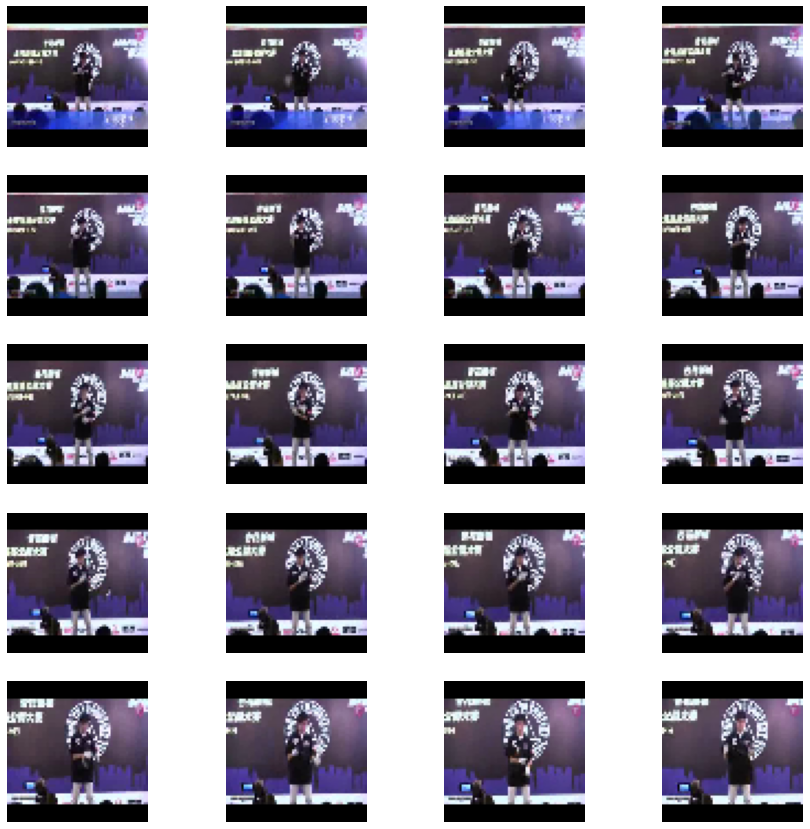

In [12]:
plt.figure(figsize=(15,15)) # visualizing frames extracted from it
for idx,frame in enumerate(process_data(os.path.join('UCF50','YoYo','v_YoYo_g01_c01.avi'),sequence_length=SEQ_LEN)):
    frame = cv2.cvtColor(frame.astype('float32'),cv2.COLOR_BGR2RGB)
    plt.subplot(5,4,idx+1)
    plt.imshow(frame)
    plt.axis('off')
plt.show()

In [13]:
# Create Dataset
def create_dataset(classes):
    
    """ 
        Extract the data from the selected action categories and forms the dataset 

        Returns:
            `tuple` : (features : `ndarray`, labels : `ndarray`, video_paths : `list`)
    """

    # features,labels and video paths
    features = []
    labels = []
    video_paths = []

    # iterating through all class list
    for idx,action in enumerate(classes):

        print('Extracting Data for Class :',action)

        video_files = os.listdir(os.path.join('UCF50',action))

        # iterate through all the video files and process it
        for video in video_files:

            # complete video path
            path = os.path.join('UCF50',action,video)

            # extract the frames
            frames = process_data(path=path,sequence_length=SEQ_LEN)
            
            # if video has lesser frames then SEQ_LEN, then ignore the video
            if(len(frames) == SEQ_LEN):
                
                features.append(frames)
                labels.append(idx)  # actions are represented with index
                video_paths.append(path)

    # convert to numpy array for better computation
    features = np.array(features)
    labels = np.array(labels)
    video_paths = np.array(video_paths)

    return (features,labels,video_paths)

In [14]:
# extracting dataset
(features,labels,video_paths) = create_dataset(CHOSEN_CLASS)

Extracting Data for Class : WalkingWithDog
Extracting Data for Class : TaiChi
Extracting Data for Class : Swing
Extracting Data for Class : HorseRace


In [19]:
features.shape # 487 videos for 4 actions, each video consists of 20 frames, each frame is of size 64,64,3

(487, 20, 64, 64, 3)

In [20]:
labels.shape

(487,)

In [21]:
video_paths.shape

(487,)

In [102]:
# saving
np.save('features_4class',features)
np.save('labels_4class',labels)
np.save('paths_4class',video_paths)

In [18]:
features = np.load('features_4class.npy')
labels = np.load('labels_4class.npy')
video_paths = np.load('paths_4class.npy')

In [22]:
# convert labels into ohe
ohe_labels = np_utils.to_categorical(labels)
ohe_labels.shape

(487, 4)

`Step 4. Split the Data into Train Test Split`

In [23]:
X_train,X_test,y_train,y_test = train_test_split(features,ohe_labels,test_size=0.25,random_state=seed_c,shuffle=True)

In [24]:
X_train.shape,y_train.shape

((365, 20, 64, 64, 3), (365, 4))

In [25]:
X_test.shape,y_test.shape

((122, 20, 64, 64, 3), (122, 4))

`Step 5. Implementing ConvLSTM`

- `ConvLSTM` cell is variant of LSTM network that contains convolution operations in the network (for `spatio-temporal prediction`)

- Convolutional LSTM (ConvLSTM) is a type of recurrent neural network architecture that combines the properties of Convolutional Neural Networks (CNNs) and Long Short-Term Memory (LSTM) networks. ConvLSTM networks are commonly used for sequence modeling tasks such as video processing, where both spatial and temporal dependencies need to be captured.

- For Video Classification, ConvLSTM effectively captures the `spatial relation in individual frames` and the `temporal relation across the frames`.

![CONVLSTM](convLSTM.png)

In [30]:
# convLSTM is capable of taking 3 dim data (width,height,channels) than simpleLSTM which takes 1 dim data

model = Sequential()

model.add(ConvLSTM2D(filters = 4,kernel_size=(3,3),activation='tanh',return_sequences=True,
                        recurrent_dropout=0.2,data_format='channels_last',
                        input_shape = (SEQ_LEN,FRAME_HEIGHT,FRAME_WIDTH,3)))
model.add(MaxPooling3D(pool_size=(1,2,2),padding='same',data_format='channels_last'))  # to reduce the size / downsampling
model.add(TimeDistributed(Dropout(0.2)))  # regularization/Dropout across all timestamp

model.add(ConvLSTM2D(filters = 8,kernel_size=(3,3),activation='tanh',return_sequences=True,
                        recurrent_dropout=0.2,data_format='channels_last'))
model.add(MaxPooling3D(pool_size=(1,2,2),padding='same',data_format='channels_last'))
model.add(TimeDistributed(Dropout(0.2)))

model.add(ConvLSTM2D(filters = 14,kernel_size=(3,3),activation='tanh',return_sequences=True,
                        recurrent_dropout=0.2,data_format='channels_last'))
model.add(MaxPooling3D(pool_size=(1,2,2),padding='same',data_format='channels_last'))
model.add(TimeDistributed(Dropout(0.2)))

model.add(ConvLSTM2D(filters = 16,kernel_size=(3,3),activation='tanh',return_sequences=True,
                        recurrent_dropout=0.2,data_format='channels_last'))
model.add(MaxPooling3D(pool_size=(1,2,2),padding='same',data_format='channels_last'))
# model.add(TimeDistributed(Dropout(0.2)))

model.add(Flatten())
model.add(Dense(len(CHOSEN_CLASS),activation='softmax'))

model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_8 (ConvLSTM2D)  (None, 20, 62, 62, 4)     1024      
                                                                 
 max_pooling3d_8 (MaxPooling  (None, 20, 31, 31, 4)    0         
 3D)                                                             
                                                                 
 time_distributed_6 (TimeDis  (None, 20, 31, 31, 4)    0         
 tributed)                                                       
                                                                 
 conv_lstm2d_9 (ConvLSTM2D)  (None, 20, 29, 29, 8)     3488      
                                                                 
 max_pooling3d_9 (MaxPooling  (None, 20, 15, 15, 8)    0         
 3D)                                                             
                                                      

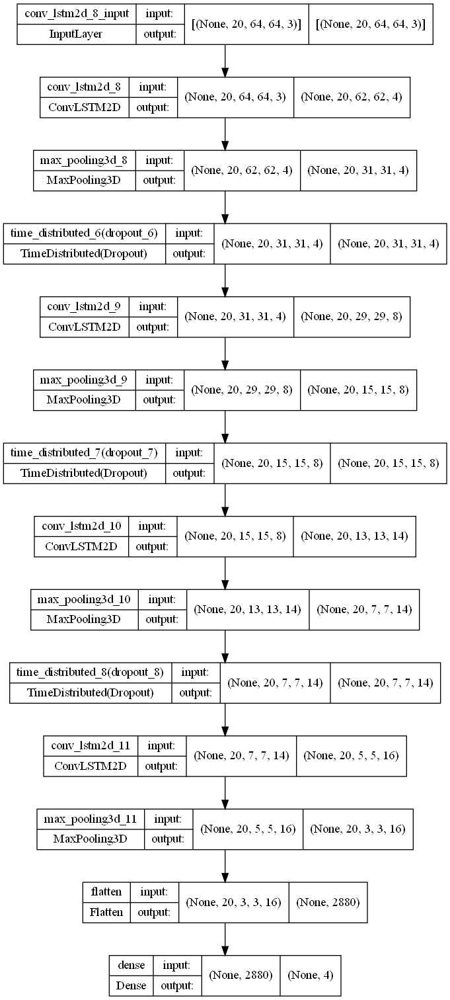

In [32]:
plot_model(model,show_shapes=True,show_layer_names=True)

In [33]:
es = EarlyStopping(monitor='val_loss',patience=10,mode='min',restore_best_weights=True)

model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])

In [34]:
# train the model
history = model.fit(X_train,y_train,epochs=50,batch_size=4,shuffle=True,validation_split=0.2,callbacks=[es])

Epoch 1/50
73/73 [==============================] - 137s 2s/step - loss: 1.3931 - accuracy: 0.2295 - val_loss: 1.3779 - val_accuracy: 0.3973
Epoch 2/50
73/73 [==============================] - 140s 2s/step - loss: 1.3792 - accuracy: 0.2945 - val_loss: 1.3197 - val_accuracy: 0.3425
Epoch 3/50
73/73 [==============================] - 121s 2s/step - loss: 1.3198 - accuracy: 0.3733 - val_loss: 1.2702 - val_accuracy: 0.4658
Epoch 4/50
73/73 [==============================] - 127s 2s/step - loss: 1.2069 - accuracy: 0.4658 - val_loss: 1.1295 - val_accuracy: 0.5205
Epoch 5/50
73/73 [==============================] - 130s 2s/step - loss: 0.9569 - accuracy: 0.5890 - val_loss: 0.8839 - val_accuracy: 0.6301
Epoch 6/50
73/73 [==============================] - 119s 2s/step - loss: 0.7247 - accuracy: 0.7192 - val_loss: 0.7801 - val_accuracy: 0.6438
Epoch 7/50
73/73 [==============================] - 114s 2s/step - loss: 0.5564 - accuracy: 0.7911 - val_loss: 0.7084 - val_accuracy: 0.7397
Epoch 8/50
73

`Step 6. Evaluating the Model`

In [35]:
test_loss,test_acc = model.evaluate(X_test,y_test)

4/4 [==============================] - 5s 1s/step - loss: 0.4759 - accuracy: 0.8115


In [36]:
model.save('convLSTM_4class.h5')

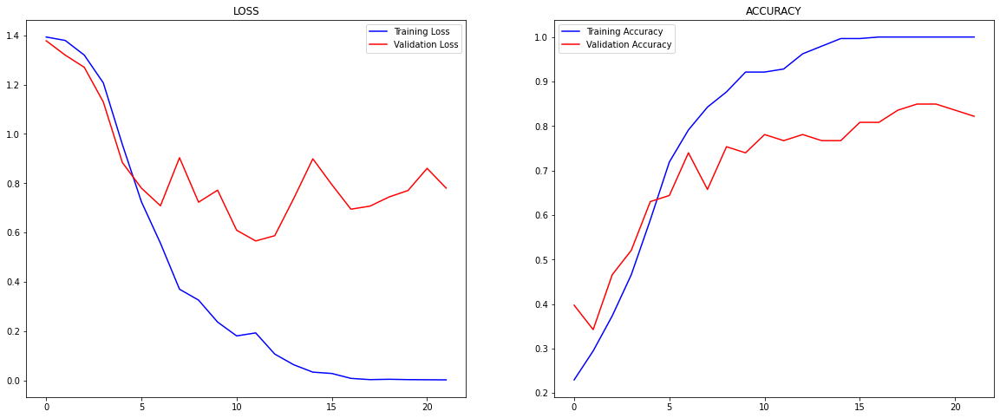

In [42]:
# plot model
loss = history.history['loss']
acc = history.history['accuracy']
val_loss = history.history['val_loss']
val_acc = history.history['val_accuracy']
epochs = np.arange(len(loss))

plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
plt.plot(epochs,loss,'blue',label='Training Loss')
plt.plot(epochs,val_loss,'red',label='Validation Loss')
plt.title('LOSS')
plt.legend()

plt.subplot(1,2,2)
plt.plot(epochs,acc,'blue',label='Training Accuracy')
plt.plot(epochs,val_acc,'red',label='Validation Accuracy')
plt.title('ACCURACY')
plt.legend()

plt.show()

`Step 7. Implementing LRCN`

LRCN = COMBINATION OF CNN & LSTM IN SINGLE MODEL (Long Term Recurrent Convolutional Network)

- The Convolutional layers are used for spatial feature extraction from individual frames and these features are then fed to LSTM Layers at each timestamp for temporal sequence modelling. This way network learns Spatio-temporal features 
- time distributed allows to fed the whole video into model in a single shot
- `architecture` -> Blocks of `Time Distributed Conv2D, MaxPooling2D and Dropout`. -> Features `Flattend` and fed to `LSTM Layers` -> `Dense Layer with softmax` to predict the action being perform

In [46]:
model2 = Sequential()
# TimeDistributed -> applies on entire sequence/all frames of video
model2.add(TimeDistributed(Conv2D(16,(3,3),padding='same',activation='relu'),
                input_shape = (SEQ_LEN,FRAME_HEIGHT,FRAME_WIDTH,3)))
model2.add(TimeDistributed(MaxPooling2D((4,4))))
model2.add(TimeDistributed(Dropout(0.25)))

model2.add(TimeDistributed(Conv2D(32,(3,3),padding='same',activation='relu')))
model2.add(TimeDistributed(MaxPooling2D((4,4))))
model2.add(TimeDistributed(Dropout(0.25)))

model2.add(TimeDistributed(Conv2D(64,(3,3),padding='same',activation='relu')))
model2.add(TimeDistributed(MaxPooling2D((2,2))))
model2.add(TimeDistributed(Dropout(0.25)))

model2.add(TimeDistributed(Conv2D(64,(3,3),padding='same',activation='relu')))
model2.add(TimeDistributed(MaxPooling2D((2,2))))
# model.add(TimeDistributed(Dropout(0.25)))

model2.add(TimeDistributed(Flatten()))

model2.add(LSTM(32))

model2.add(Dense(len(CHOSEN_CLASS),activation='softmax'))

model2.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_12 (TimeDi  (None, 20, 64, 64, 16)   448       
 stributed)                                                      
                                                                 
 time_distributed_13 (TimeDi  (None, 20, 16, 16, 16)   0         
 stributed)                                                      
                                                                 
 time_distributed_14 (TimeDi  (None, 20, 16, 16, 16)   0         
 stributed)                                                      
                                                                 
 time_distributed_15 (TimeDi  (None, 20, 16, 16, 32)   4640      
 stributed)                                                      
                                                                 
 time_distributed_16 (TimeDi  (None, 20, 4, 4, 32)    

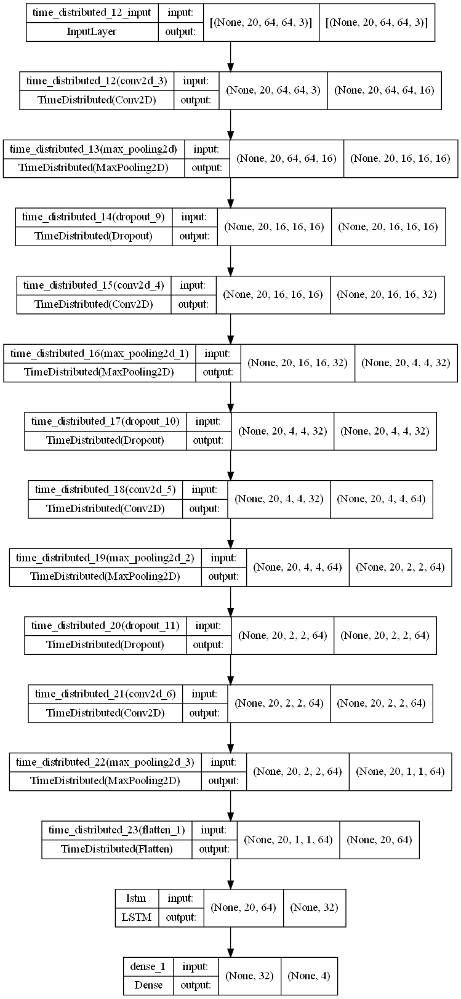

In [52]:
plot_model(model2,show_shapes=True,show_layer_names=True)

In [54]:
es1  = EarlyStopping(monitor='val_loss',patience=15,mode='min',restore_best_weights=True)

model2.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

In [55]:
history2 = model2.fit(X_train,y_train,epochs=70,callbacks=[es1],validation_split=0.2,batch_size=4,shuffle=True) 

Epoch 1/70
73/73 [==============================] - 13s 124ms/step - loss: 1.3917 - accuracy: 0.2808 - val_loss: 1.3688 - val_accuracy: 0.3562
Epoch 2/70
73/73 [==============================] - 8s 113ms/step - loss: 1.3691 - accuracy: 0.3185 - val_loss: 1.3478 - val_accuracy: 0.4521
Epoch 3/70
73/73 [==============================] - 8s 113ms/step - loss: 1.3210 - accuracy: 0.4041 - val_loss: 1.2406 - val_accuracy: 0.4247
Epoch 4/70
73/73 [==============================] - 8s 113ms/step - loss: 1.1672 - accuracy: 0.5068 - val_loss: 0.9180 - val_accuracy: 0.6301
Epoch 5/70
73/73 [==============================] - 8s 115ms/step - loss: 0.9885 - accuracy: 0.5925 - val_loss: 0.8205 - val_accuracy: 0.7123
Epoch 6/70
73/73 [==============================] - 9s 118ms/step - loss: 0.8847 - accuracy: 0.6438 - val_loss: 0.6505 - val_accuracy: 0.7808
Epoch 7/70
73/73 [==============================] - 9s 127ms/step - loss: 0.7823 - accuracy: 0.6815 - val_loss: 0.6972 - val_accuracy: 0.7671
Epoch

In [56]:
# evaluate the model
test_loss2,test_acc2 = model2.evaluate(X_test,y_test)

4/4 [==============================] - 1s 210ms/step - loss: 0.4033 - accuracy: 0.8852


In [57]:
model.save('convLRCN_4class.h5')

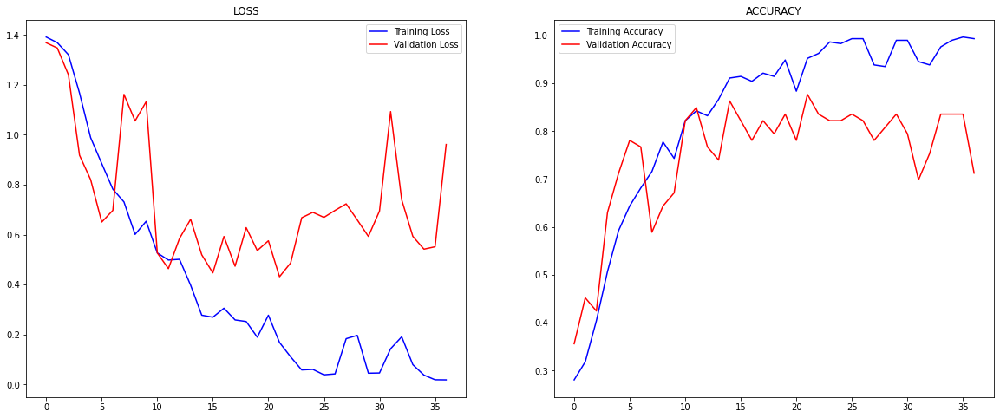

In [58]:
# plot model
loss = history2.history['loss']
acc = history2.history['accuracy']
val_loss = history2.history['val_loss']
val_acc = history2.history['val_accuracy']
epochs = np.arange(len(loss))

plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
plt.plot(epochs,loss,'blue',label='Training Loss')
plt.plot(epochs,val_loss,'red',label='Validation Loss')
plt.title('LOSS')
plt.legend()

plt.subplot(1,2,2)
plt.plot(epochs,acc,'blue',label='Training Accuracy')
plt.plot(epochs,val_acc,'red',label='Validation Accuracy')
plt.title('ACCURACY')
plt.legend()

plt.show()

In [4]:
model2 = load_model('convLRCN_4class.h5')

`Step 8. Testing Performance On Youtube Videos`

In [24]:
def download_video(URL,store_path_dir):

    # create video object
    video = YouTube(URL) # it will contain all info about video

    # extract the video title
    title = video.title

    # get highest resolution video+audio
    best = video.streams.get_highest_resolution()

    output = os.path.join(store_path_dir,f'{title}.mp4')

    # download the video at best resolution quality
    best.download(filename=output)

    return title

In [5]:
test_videos_dir = 'test_video'
os.makedirs(test_videos_dir,exist_ok=True)
prediction_videos = 'prediction'
os.makedirs(prediction_videos,exist_ok=True)

In [69]:
URL = 'https://www.youtube.com/watch?v=8u0qjmHIOcE'

title = download_video(URL,test_videos_dir)

In [135]:
video_path = os.path.join(test_videos_dir,f'{title}.mp4')

In [6]:
# for real time prob stats
def probVisualizer(image,pred,actions):
    colors = [(245,117,16),(117,16,245),(16,245,117),(0,0,0)] # for each actions
    output = image.copy()
    for idx,prob in enumerate(pred):
        cv2.rectangle(output,(0,140+idx*20),(int(prob*100*0.8),(160+idx*20)),colors[idx],-1) # start (x,y) & end (x,y) coordinates
        cv2.putText(output,actions[idx],(0,155+idx*20),cv2.FONT_HERSHEY_SIMPLEX,0.4,(255,255,255),1,cv2.LINE_AA)
    
    return output

In [7]:
# perform action recognition
from collections import deque  # for storing constant frames
def actionRecognizer(input_path,output_path,SEQUENCE_LENGTH):
    """ This function will Read the Video frame by frame from the `input_path` and will perform action recognition on defined `model` and save the results to `output_path` """

    # initialize the video capture object   
    cap = cv2.VideoCapture(input_path)

    # get width and height of the video so, it can be pass to videowriter object
    image_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    image_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))

    # initialize the videowriter object to save the predicted video
    writer = cv2.VideoWriter(output_path,cv2.VideoWriter_fourcc('M','P','4','V'),
                             cap.get(cv2.CAP_PROP_FPS),(image_width,image_height))
    
    # initializing queue to store frames
    queue = deque(maxlen=SEQUENCE_LENGTH)

    predicted_class = ''

    # access video frame by frame
    while cap.isOpened():

        # read frame
        ret,frame = cap.read()

        if not ret:
            break

        # resizing and normalizing for making predictions
        resized_image = cv2.resize(frame,(FRAME_HEIGHT,FRAME_WIDTH))
        normalize_image = resized_image/255

        queue.append(normalize_image)

        if(len(queue) == SEQUENCE_LENGTH):  # can make predictions now

            # predict softmax probabilities by passing sequence of frames to model
            predict_prob = model2.predict(np.expand_dims(queue,axis=0))[0] # LRCN model

            # get index for highest class probability
            index = np.argmax(predict_prob)

            # get class label from index
            predicted_class = CHOSEN_CLASS[index]

            frame = probVisualizer(frame,predict_prob,CHOSEN_CLASS)
        
            cv2.rectangle(frame,(0,0),(200,30),(0,0,0),-1)
            
        # write predicted class on top of video
        cv2.putText(frame,predicted_class,(10,20),cv2.FONT_HERSHEY_SIMPLEX,0.6,(0,0,255),2)        


        writer.write(frame)

    # release videocapture and writer objects
    cap.release()
    writer.release()

In [115]:
# testing
output_path = os.path.join(prediction_videos,f'{title}_{SEQ_LEN}.mp4')
actionRecognizer(video_path,output_path,SEQ_LEN)

In [116]:
from moviepy.editor import *
VideoFileClip(output_path,audio=False,target_resolution=(400,None)).ipython_display()

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [149]:
# for single class prediction, that is if video contains single activity
def singleActionRecognizer(input_path,SEQUENCE_LENGTH):
    """ This function will extract uniform distributed `SEQUENCE_LENGTH` frames from the entire video and then make a prediction using LRCN Model, Preferabble when working with videos containing single activity """
    
    # initialize videocapture object
    cap = cv2.VideoCapture(input_path)

    # to store `SEQUENCE_LENGTH` frames across the video
    frames = []

    predicted_class = ''

    # get total frames in the video
    count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    # interval after which frames will be added to list
    skip_window = max(int(count/SEQUENCE_LENGTH),1)    # ex. -> int(187/20) = 9, pick every 9th frame

    # extract frames
    for counter in range(SEQUENCE_LENGTH):

        # set the current frame position
        cap.set(cv2.CAP_PROP_POS_FRAMES,counter*skip_window) # it starts reading from this frame

        # read the frame
        res,frame = cap.read()

        if not res: # video frame not read properly
            break

        # RESIZING
        resize_image = cv2.resize(frame,(FRAME_HEIGHT,FRAME_WIDTH))

        # NORMALIZE THE FRAME BY DIVIDING IT BY 255 -> RANGE -> [0-1]
        normalize_frame = resize_image/255

        frames.append(normalize_frame) # will add numpy vector to it
    

    # predicting class by passing the evenly distributed frames to LRCN model
    predicted_prob = model2.predict(np.expand_dims(frames,axis=0))[0]
    print(predicted_prob)

    # get index for highest class probability
    index = np.argmax(predicted_prob)

    # get class label from index
    predicted_class = CHOSEN_CLASS[index]
    
    print(f'Predicted Action : {predicted_class}\nConfidence : {predicted_prob[index]*100} %')
    
    # release the video capture
    cap.release()
    

In [ ]:
example1URL = 'https://youtu.be/fc3w827kwyA'
title1 = download_video(example1URL,test_videos_dir)

In [146]:
video_path1 = os.path.join(test_videos_dir,f'{title1}.mp4')
video_path1

'test_video\\Comparison of Four Styles of Tai Chi.mp4'

In [150]:
singleActionRecognizer(video_path1,SEQ_LEN)  # not giving too much accurate result, because video is large, not we are only extracting 20 frames, which may not always contains all info
# VideoFileClip(video_path1, audio=False, target_resolution=(400,None)).ipython_display()

[0.67927176 0.3043026  0.01297431 0.00345136]
Predicted Action : WalkingWithDog
Confidence : 67.92717576026917 %


In [83]:
# second approach to single action recognizer -> take `seq_len` frame window and predict for each `seq_len` frames, and output the most predicted class -> more computational expensive

# perform action recognition
from collections import Counter
def singleActionRecognizer_V2(input_path,SEQUENCE_LENGTH):
    """ This function will predict for each `SEQUENCE_LENGTH` frames from video using LRCN Model, Preferabble when working with videos containing single activity """

    # initialize the video capture object   
    cap = cv2.VideoCapture(input_path)
    
    # initializing queue to store frames
    queue = deque(maxlen=SEQUENCE_LENGTH)

    predicted_class = []

    # access video frame by frame
    while cap.isOpened():

        # read frame
        ret,frame = cap.read()

        if not ret:
            break

        # resizing and normalizing for making predictions
        resized_image = cv2.resize(frame,(FRAME_HEIGHT,FRAME_WIDTH))
        normalize_image = resized_image/255

        queue.append(normalize_image)

        # it will predict for every SEQUENCE_LENGTH frames
        if(len(queue) == SEQUENCE_LENGTH):  # can make predictions now

            # predict softmax probabilities by passing sequence of frames to model
            predict_prob = model2.predict(np.expand_dims(queue,axis=0))[0] # LRCN model

            # get index for highest class probability
            index = np.argmax(predict_prob)

            # get class label from index
            predicted_class.append(index)

            # queue.clear()

    print(Counter(predicted_class))
    pred = Counter(predicted_class).most_common()[0][0]
    
    print(f'Predicted Action : {CHOSEN_CLASS[pred]}')

    # release videocapture object
    cap.release()

`Note : ` another more efficient method is to predict for every window (frames in queue), (`sliding window by 1`) -> it will increase the computation for predicting for ex: if video has 1000 frames and SEQUENCE_LENGTH = 20, using current method, we will predict for every 20 frames in working window (`sliding window by 20`) = 1000/20 = 50 prediction, and using above mentioned approach, we will not make the prediction until the window has 20 frames, once, window has 20 frames, we simply slide the window by 1, and every time will make prediction -> 1000-20+1 = 981 prediction (more accurate as it works on every sequence of data) but it will be much much computationally expensive and will take around 5-10 mins to predict a single 2-3 action minute video

`In Both the cases we will predict the most common predicted class from all prediction as FINAL PREDICTION`

`TAICHI` prediction

In [13]:
os.listdir(test_videos_dir)[0]

'Comparison of Four Styles of Tai Chi.mp4'

In [14]:
video_path1 = os.path.join(test_videos_dir,os.listdir(test_videos_dir)[0])
video_path1

'test_video\\Comparison of Four Styles of Tai Chi.mp4'

In [19]:
cap = cv2.VideoCapture(video_path1)
print(cap.get(cv2.CAP_PROP_FRAME_COUNT))  # 6220 -> 6220/20 = 311 prediction
cap.release()

6220.0


In [15]:
singleActionRecognizer_V2(video_path1,SEQ_LEN)  # mostly gives correct prediction -> time reduced from 10min to 32s

Predicted Action : TaiChi


`Walking With Dog` class

In [25]:
dog_url = 'https://www.youtube.com/watch?v=3Af2GDhRafQ'

dog_title = download_video(dog_url,test_videos_dir)

In [73]:
video_path2 = os.path.join(test_videos_dir,f'{dog_title}.mp4')
cap = cv2.VideoCapture(video_path2)
print(cap.get(cv2.CAP_PROP_FRAME_COUNT))  # 79 -> 79/20 = 3 prediction
cap.release()

79.0


In [74]:
singleActionRecognizer_V2(video_path2,SEQ_LEN)  # incorrect prediction due to less frames

Counter({2: 3})
Predicted Action : Swing


In [75]:
os.listdir(test_videos_dir)[-1]

'walking dog.mp4'

In [76]:
video_path3 = os.path.join(test_videos_dir,os.listdir(test_videos_dir)[-1])
cap = cv2.VideoCapture(video_path3)
print(cap.get(cv2.CAP_PROP_FRAME_COUNT))  # 210 -> 210/20 = 10 prediction
cap.release()

210.0


In [77]:
singleActionRecognizer_V2(video_path3,SEQ_LEN)  # better result due to more frames

Counter({0: 6, 2: 4})
Predicted Action : WalkingWithDog


`Note : if video has lesser no. of frames then model will make less no. of prediction, and overall prediction may be incorrect`

`Swing` Class

In [80]:
os.listdir(test_videos_dir)[3]

'swing.mp4'

In [81]:
video_path4 = os.path.join(test_videos_dir,os.listdir(test_videos_dir)[3])
cap = cv2.VideoCapture(video_path4)
print(cap.get(cv2.CAP_PROP_FRAME_COUNT))  # 250 -> 250/20 = 12 prediction
cap.release()

250.0


In [82]:
singleActionRecognizer_V2(video_path4,SEQ_LEN)  # wrong result but it predicts 2 times

Counter({1: 10, 2: 2})
Predicted Action : TaiChi


In [84]:
singleActionRecognizer_V2(video_path4,SEQ_LEN)  # using window size of 1 , again confidence is low for swing, but appears in top-2 prediction

Counter({1: 187, 2: 35, 0: 9})
Predicted Action : TaiChi


`Horserace` Class

In [85]:
os.listdir(test_videos_dir)[2]

'horserace.mp4'

In [86]:
video_path5 = os.path.join(test_videos_dir,os.listdir(test_videos_dir)[2])
cap = cv2.VideoCapture(video_path5)
print(cap.get(cv2.CAP_PROP_FRAME_COUNT))  # 487 -> 487/20 = 24 prediction
cap.release()

487.0


In [87]:
singleActionRecognizer_V2(video_path5,SEQ_LEN)   # becuase horse is in motion so its spatial-temporal data is like swing

Counter({2: 345, 0: 80, 1: 30, 3: 13})
Predicted Action : Swing
